In [1]:
import os
import logging
import numpy as np
import random
import warnings

seed = 42

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd()+'/configs/'

warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

np.random.seed(seed)
random.seed(seed)

In [2]:
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl

tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)
print(tf.__version__)

2.17.0


In [3]:
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, confusion_matrix
import pandas as pd
import seaborn as sns
import zipfile
from utils import load_images_from_folder

## Load and process the dataset

In [4]:
# Conditional check for unzip
unzip = False
path = 'animals.zip'
if unzip:
	with zipfile.ZipFile(path, 'r') as zip_ref:
		zip_ref.extract('animals', './')


In [6]:
animal_paths = 'animals/'
animals = load_images_from_folder(animal_paths)

In [7]:
items_path = 'items/'
items = load_images_from_folder(items_path)

### Display Loaded Images

In [8]:
animals.shape

(120, 224, 224, 3)

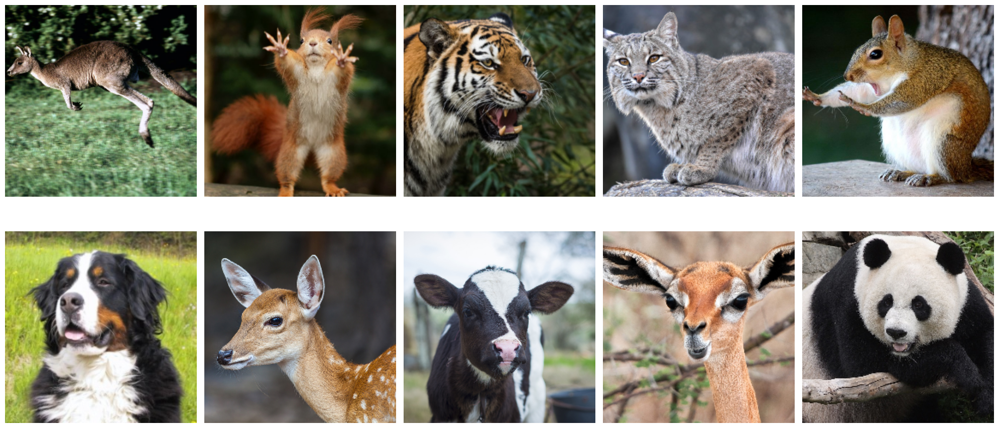

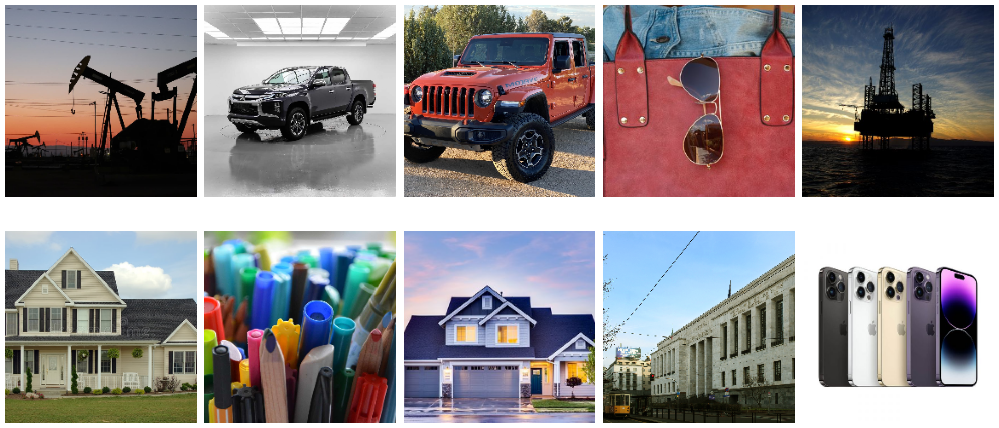

In [9]:
num_img = 10

fig, axes = plt.subplots(2, num_img//2, figsize=(20, 10))
for i in range(num_img):
	ax = axes[i//(num_img//2), i%(num_img//2)]
	ax.imshow(np.clip(animals[i], 0, 255))
	ax.axis('off')
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(2, num_img//2, figsize=(20, 10))
for i in range(num_img):
	ax = axes[i//(num_img//2), i%(num_img//2)]
	ax.imshow(np.clip(items[i], 0, 255))
	ax.axis('off')
plt.tight_layout()
plt.show()

### Let's now concatene over the O dimension the two datasets

In [10]:
img_map = {
	'0': 'item',
	'1': 'animal'
}

X = np.concatenate([animals, items], axis=0)

# Create the labes for the images 1 for 'animals' and 0 for 'items'
y = np.concatenate([np.ones(animals.shape[0]), np.zeros(items.shape[0])])

# Convert the labels to one-hot encoding
y = tfk.utils.to_categorical(y, num_classes=len(np.unique(y)))

X_tv, X_test, y_tv, y_test = train_test_split(X, y, test_size=0.25, random_state=seed, stratify=np.argmax(y, axis=1))
X_train, X_val, y_train, y_val = train_test_split(X_tv, y_tv, test_size=len(X_test), random_state=seed, stratify=np.argmax(y_tv, axis=1))

print(f'X_train shape; {X_train.shape}')
print(f'X_val shape; {X_val.shape}')
print(f'X_test shape; {X_test.shape}')
print(f'y_train shape; {y_train.shape}')
print(f'y_val shape; {y_val.shape}')
print(f'y_test shape; {y_test.shape}')

X_train shape; (120, 224, 224, 3)
X_val shape; (60, 224, 224, 3)
X_test shape; (60, 224, 224, 3)
y_train shape; (120, 2)
y_val shape; (60, 2)
y_test shape; (60, 2)


In [11]:
# Define the model parameters
input_shape = X_train.shape[1:]
output_shape = y_train.shape[-1]
batch_size = 32
epochs = 1000
print(f'Input shape: {input_shape}, output shape: {output_shape}, batch size: {batch_size}, epochs: {epochs}')

Input shape: (224, 224, 3), output shape: 2, batch size: 32, epochs: 1000


In [12]:
early_stopping = tfk.callbacks.EarlyStopping(monitor='val_accuracy',
											 patience=100,
											 restore_best_weights=True,
											 mode='auto')
callbacks = [early_stopping]


### Build the model
Recall that to compute:
- `number of parameters on convolutional layers`: $$ num\_param = num\_filters*filter\_size^2*depth + num\_filters$$
- `size of the output after convolution`: $$output\_size = \frac{input\_size + 2padding - filter\_size}{stride} + 1$$
- `number of parameters after a dense layer`: $$num\_param = (input\_size + 1)*output\_size$$

In [13]:
def build_model(input_shape: tuple, output_shape: int):
	"""Build the model.

	Args:
		input_shape (tuple): The shape of the input.
		output_shape (int): The number of classes.

	Returns:
		tfk.Model: The model.

	"""
	model = tfk.Sequential([
		tfkl.InputLayer(input_shape=input_shape, name='input'),
		# First convolutional layer
		tfkl.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='conv1'),
		tfkl.MaxPooling2D(name='mp1'),
		# Second convolutional layer
		tfkl.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='conv2'),
		tfkl.MaxPooling2D(name='mp2'),
		# Third convolutional layer
		tfkl.Conv2D(filters=128, kernel_size=3, activation='relu', padding='same', name='conv3'),
		tfkl.MaxPooling2D(name='mp3'),
		# Forth convolutional layer
		tfkl.Conv2D(filters=256, kernel_size=3, activation='relu', padding='same', name='conv4'),
		tfkl.MaxPooling2D(name='mp4'),
		# Fith convolutional layer
		tfkl.Conv2D(filters=512, kernel_size=3, activation='relu', padding='same', name='conv5'),
		tfkl.MaxPooling2D(name='mp5'),
		# Global average pooling
		tfkl.GlobalAveragePooling2D(name='gap'),
		# Output layer
		tfkl.Dense(output_shape, activation='softmax', name='output')
	], name='CNN')

	# Compile the model
	model.compile(optimizer='adam',
				  loss='categorical_crossentropy',
				  metrics=['accuracy'])
	return model

In [14]:
model = build_model(input_shape, output_shape)
model.summary()
tfk.utils.plot_model(model, show_shapes=True)

I0000 00:00:1723981756.019146   96016 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:05:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1723981756.151591   96016 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:05:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1723981756.151658   96016 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:05:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1723981756.154443   96016 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:05:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1723981756.154513   96016 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:05:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:0

Model: "CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1 (Conv2D)                  │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mp1 (MaxPooling2D)              │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mp2 (MaxPooling2D)              │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mp3 (MaxPooling2D)              │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv4 (Conv2D)                  │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mp4 (MaxPooling2D)              │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv5 (Conv2D)                  │ (None, 14, 14, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mp5 (MaxPooling2D)              │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gap (GlobalAveragePooling2D)    │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 2)              │         1,026 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,569,602 (5.99 MB)

 Trainable params: 1,569,602 (5.99 MB)

 Non-trainable params: 0 (0.00 B)

You must install pydot (`pip install pydot`) for `plot_model` to work.


In [15]:
# Train the model 
history = model.fit(X_train, y_train,
					validation_data=(X_val, y_val),
					batch_size=batch_size,
					callbacks=callbacks,
					epochs=epochs
					).history

Epoch 1/1000


I0000 00:00:1723981758.435815   97264 service.cc:146] XLA service 0x7f464c00ee40 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1723981758.435850   97264 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce RTX 3080, Compute Capability 8.6


1/4 ━━━━━━━━━━━━━━━━━━━━ 16s 6s/step - accuracy: 0.5625 - loss: 0.6930

I0000 00:00:1723981762.998315   97264 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


4/4 ━━━━━━━━━━━━━━━━━━━━ 19s 4s/step - accuracy: 0.5492 - loss: 0.6953 - val_accuracy: 0.5500 - val_loss: 0.6907
Epoch 2/1000
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.5067 - loss: 0.6851 - val_accuracy: 0.5500 - val_loss: 0.6823
Epoch 3/1000
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.5738 - loss: 0.6618 - val_accuracy: 0.5000 - val_loss: 0.7295
Epoch 4/1000
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5408 - loss: 0.6962 - val_accuracy: 0.5667 - val_loss: 0.6544
Epoch 5/1000
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.6154 - loss: 0.6459 - val_accuracy: 0.6833 - val_loss: 0.6261
Epoch 6/1000
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.6675 - loss: 0.6106 - val_accuracy: 0.7500 - val_loss: 0.5649
Epoch 7/1000
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.7527 - loss: 0.5684 - val_accuracy: 0.7000 - val_loss: 0.5772
Epoch 8/1000
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.6910 - loss: 0.5264 - val_accuracy: 0.6667 - val_loss: 0.634

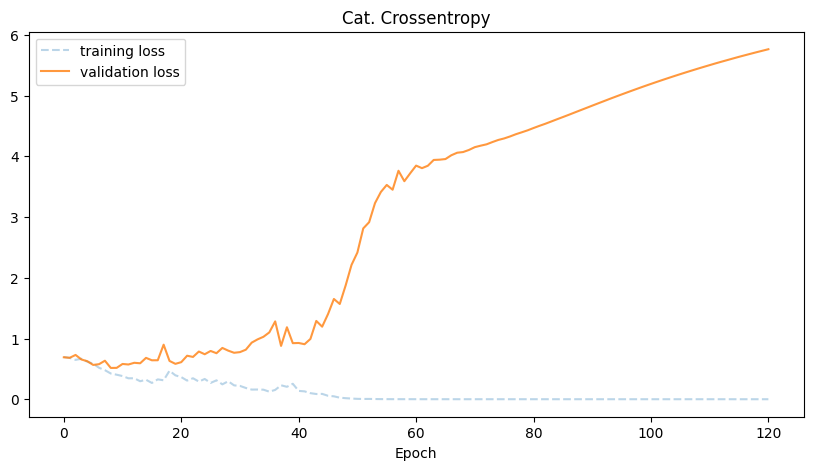

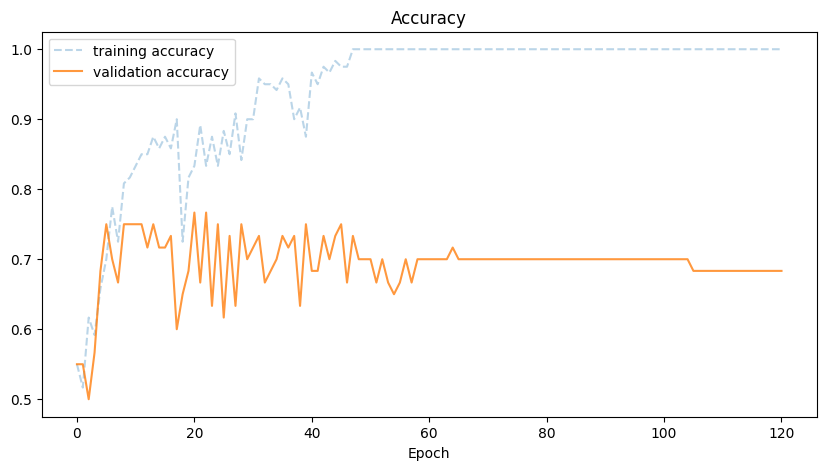

In [16]:
# Plot training history
plt.figure(figsize=(10, 5))
plt.plot(history['loss'], alpha=.3, label='training loss', linestyle='--')
plt.plot(history['val_loss'], label='validation loss', alpha=.8)
plt.legend(loc='best')
plt.xlabel('Epoch')
plt.title('Cat. Crossentropy')
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(history['accuracy'], alpha=.3, label='training accuracy', linestyle='--')
plt.plot(history['val_accuracy'], label='validation accuracy', alpha=.8)
plt.legend(loc='best')
plt.xlabel('Epoch')
plt.title('Accuracy')
plt.show()


### Data Augmentation
Let's now explore some augmentation technique, implemented using keras layers. We will focus on:
1. `Random Flip`
2. `Random Translation`
3. `Random Rotation`
4. `Random Zoom`
5. `Radom Brightness`
6. `Random Contrast`

In [17]:
def compare_augmented_images(augmented_images: np.ndarray, 
							 original_images: np.ndarray, 
							 num_img: int = 10,
							 clip_range=(0,255)):
	"""Compare the augmented images versus the origina images.

	Args:
		augmented_images (np.ndarray): The augmented images.
		original_images (np.ndarray): The original images.
		num_img (int): The number of images to compare.
		clip_range (tuple): The range to clip the pixel values.

	"""
	fig, axes = plt.subplots(2, num_img, figsize=(20, 4))
	for i in range(num_img):
		ax = axes[0, i%(num_img)]
		ax.imshow(np.clip(augmented_images[i], *clip_range))
		ax.axis('off')
		ax = axes[1, i%(num_img)]
		ax.imshow(np.clip(original_images[i], 0, 255))
		ax.axis('off')
	plt.tight_layout()
	plt.show()

#### 1 Random Flip

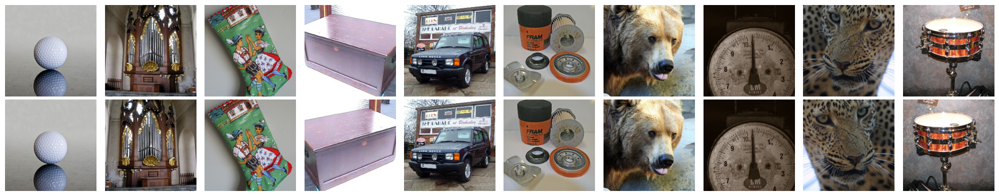

In [18]:
flip = tfk.Sequential([
	tfkl.RandomFlip('horizontal')
])
X_train_flip = flip(X_train)
compare_augmented_images(X_train_flip, X_train)


### 2. Random Translation

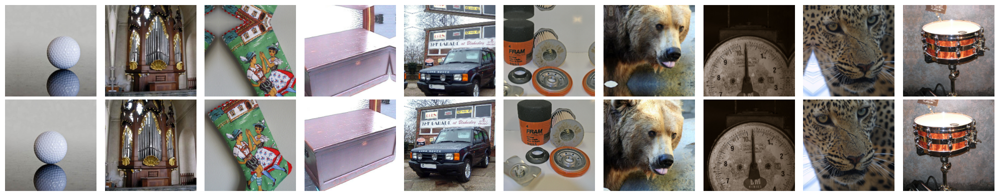

In [19]:
translation = tfk.Sequential([
	tfkl.RandomTranslation(0.2, 0.2),
])
X_train_translation = translation(X_train)
compare_augmented_images(X_train_translation, X_train)

### 3. Random Rotation

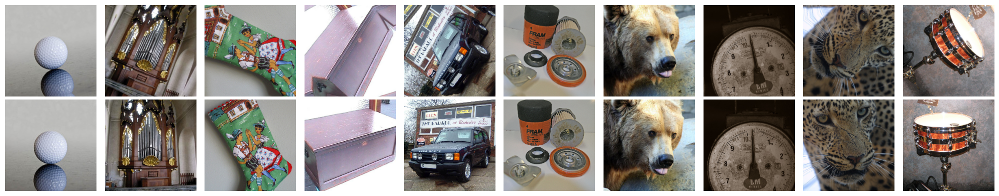

In [20]:
rotation = tfk.Sequential([
	tfkl.RandomRotation(0.2),
])
X_train_rotation = rotation(X_train)
compare_augmented_images(X_train_rotation, X_train)

### 4. Random Zoom

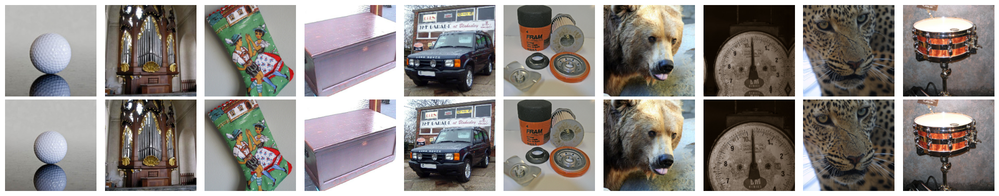

In [21]:
zoom = tfk.Sequential([
	tfkl.RandomZoom(0.2),
])
X_train_zoom = zoom(X_train)
compare_augmented_images(X_train_zoom, X_train)

### 5. Random Brightness

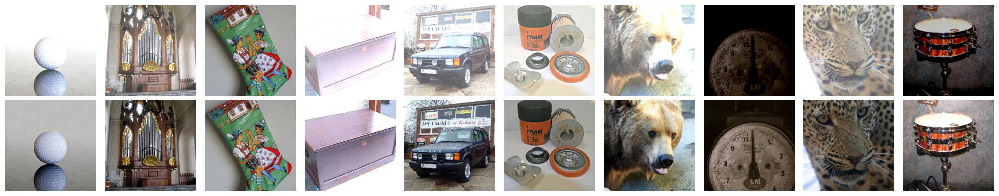

In [22]:
brightness = tfk.Sequential([
	tfkl.RandomBrightness(0.5, value_range=(0,1))
])
X_train_brightness = brightness(X_train)
compare_augmented_images(X_train_brightness, X_train)

### 6. Random Contrast

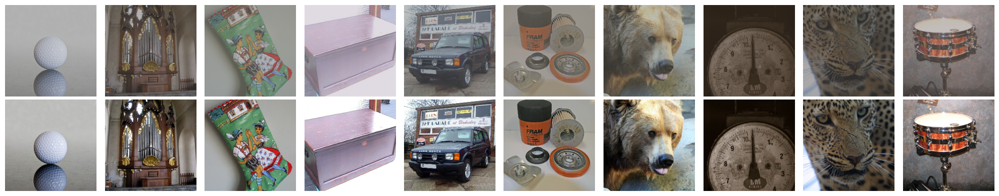

In [23]:
contrast = tfk.Sequential([
	tfkl.RandomContrast(0.75)
])
X_train_contrast = contrast(X_train)
compare_augmented_images(X_train_contrast, X_train, clip_range=(0,1))

In [24]:
def build_augmented_model(input_shape: tuple, output_shape: int):
	"""Build the model with data augmentation.

	Args:
		input_shape (tuple): The shape of the input.
		output_shape (int): The number of classes.

	Returns:
		tfk.Model: The model with augmentation preprocessing layer.

	"""
	# Define the preprocessing layer
	preprocessing = tfk.Sequential([
		tfkl.RandomBrightness(0.2, value_range=(0,1)),
		tfkl.RandomTranslation(0.2, 0.2),
	], name='preprocessing')

	# Build the model
	model = tfk.Sequential([
		tfkl.InputLayer(input_shape=input_shape, name='input'),
		preprocessing,
		# First convolutional layer
		tfkl.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', name='conv1'),
		tfkl.MaxPooling2D(name='mp1'),
		# Second convolutional layer
		tfkl.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', name='conv2'),
		tfkl.MaxPooling2D(name='mp2'),
		# Third convolutional layer
		tfkl.Conv2D(filters=128, kernel_size=3, activation='relu', padding='same', name='conv3'),
		tfkl.MaxPooling2D(name='mp3'),
		# Forth convolutional layer
		tfkl.Conv2D(filters=256, kernel_size=3, activation='relu', padding='same', name='conv4'),
		tfkl.MaxPooling2D(name='mp4'),
		# Fith convolutional layer
		tfkl.Conv2D(filters=512, kernel_size=3, activation='relu', padding='same', name='conv5'),
		tfkl.MaxPooling2D(name='mp5'),
		# Global average pooling
		tfkl.GlobalAveragePooling2D(name='gap'),
		# Output layer
		tfkl.Dense(output_shape, activation='softmax', name='output')
	], name='augmented_CNN')

	model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

	return model

In [25]:
augmented_model = build_augmented_model(input_shape, output_shape)
augmented_model.summary()

Model: "augmented_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ preprocessing (Sequential)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mp1 (MaxPooling2D)              │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mp2 (MaxPooling2D)              │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mp3 (MaxPooling2D)              │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv4 (Conv2D)                  │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mp4 (MaxPooling2D)              │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv5 (Conv2D)                  │ (None, 14, 14, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mp5 (MaxPooling2D)              │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gap (GlobalAveragePooling2D)    │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 2)              │         1,026 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,569,602 (5.99 MB)

 Trainable params: 1,569,602 (5.99 MB)

 Non-trainable params: 0 (0.00 B)

In [26]:
aug_history = augmented_model.fit(X_train, y_train,
								  validation_data=(X_val, y_val),
								  batch_size=batch_size,
								  callbacks=callbacks,
								  epochs=epochs
								  ).history

Epoch 1/1000


W0000 00:00:1723981799.478205   97262 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981799.498262   97262 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981799.505195   97262 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981799.514836   97262 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981799.522078   97262 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981799.536198   97262 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981799.547133   97262 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981799.555966   97262 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981799.572200   97262 gp

3/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.4809 - loss: 0.7097

W0000 00:00:1723981800.969730   97262 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981800.970756   97262 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981800.971810   97262 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981800.973030   97262 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981800.974133   97262 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981800.975341   97262 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981800.976644   97262 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981800.978013   97262 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981800.979571   97262 gp

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step - accuracy: 0.4857 - loss: 0.7092

W0000 00:00:1723981801.778150   97262 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981801.960554   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981801.965541   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981801.966590   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981801.967523   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981801.968443   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981801.969363   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981801.970252   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981801.971934   97263 gp

4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 680ms/step - accuracy: 0.4885 - loss: 0.7090 - val_accuracy: 0.5000 - val_loss: 0.6974
Epoch 2/1000
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - accuracy: 0.4688 - loss: 0.6977

W0000 00:00:1723981802.825911   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981802.827247   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981802.828419   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981802.829639   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981802.830811   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981802.832165   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981802.833369   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981802.834566   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981802.835878   97263 gp

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4985 - loss: 0.6955 - val_accuracy: 0.5000 - val_loss: 0.6927
Epoch 3/1000
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.6185 - loss: 0.6883 - val_accuracy: 0.5167 - val_loss: 0.6931
Epoch 4/1000
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.5400 - loss: 0.6700 - val_accuracy: 0.5167 - val_loss: 0.7309
Epoch 5/1000
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.6046 - loss: 0.6622 - val_accuracy: 0.5667 - val_loss: 0.6745
Epoch 6/1000
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - accuracy: 0.6823 - loss: 0.6169 - val_accuracy: 0.6167 - val_loss: 0.7013
Epoch 7/1000
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.7008 - loss: 0.5794 - val_accuracy: 0.6333 - val_loss: 0.7088
Epoch 8/1000
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.7106 - loss: 0.5861 - val_accuracy: 0.6000 - val_loss: 0.7392
Epoch 9/1000
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.6513 - loss: 0.5992 - val_accuracy: 0.6333 - val_loss: 0.71

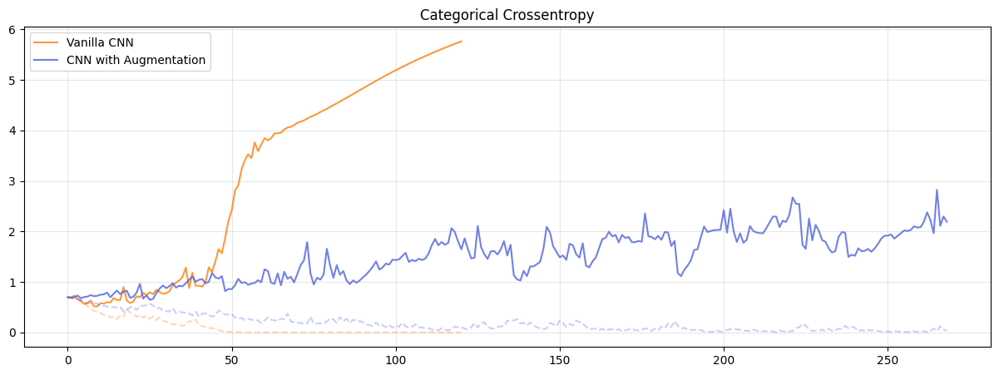

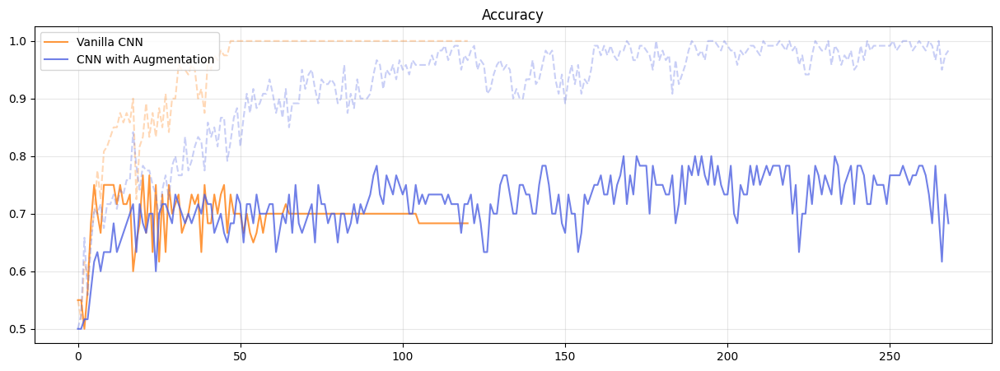

In [27]:
# Plot the training
plt.figure(figsize=(15,5))
plt.plot(history['loss'], alpha=.3, color='#ff7f0e', linestyle='--')
plt.plot(history['val_loss'], label='Vanilla CNN', alpha=.8, color='#ff7f0e')
plt.plot(aug_history['loss'], alpha=.3, color='#4D61E2', linestyle='--')
plt.plot(aug_history['val_loss'], label='CNN with Augmentation', alpha=.8, color='#4D61E2')
plt.legend(loc='upper left')
plt.title('Categorical Crossentropy')
plt.grid(alpha=.3)

plt.figure(figsize=(15,5))
plt.plot(history['accuracy'], alpha=.3, color='#ff7f0e', linestyle='--')
plt.plot(history['val_accuracy'], label='Vanilla CNN', alpha=.8, color='#ff7f0e')
plt.plot(aug_history['accuracy'], alpha=.3, color='#4D61E2', linestyle='--')
plt.plot(aug_history['val_accuracy'], label='CNN with Augmentation', alpha=.8, color='#4D61E2')
plt.legend(loc='upper left')
plt.title('Accuracy')
plt.grid(alpha=.3)

plt.show()


In [28]:
augmented_model.save('augmented_model.keras')
del augmented_model

## Inference Time
So, we have seen that the augmented model performs better on the validation data, thus, let's test it on the test set

In [29]:
augmented_model = tfk.models.load_model('augmented_model.keras')

In [30]:
predictions = augmented_model.predict(X_test)

print(f'Predictions shape: {predictions.shape}')

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Predictions shape: (60, 2)


In [31]:
# Compute the confusion matrix
y_pred = np.argmax(predictions, axis=1)
y_true = np.argmax(y_test, axis=1)

cm = confusion_matrix(y_true, y_pred)
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
recall = recall_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1: {f1:.2f}')


Accuracy: 0.73
Precision: 0.74
Recall: 0.73
F1: 0.73


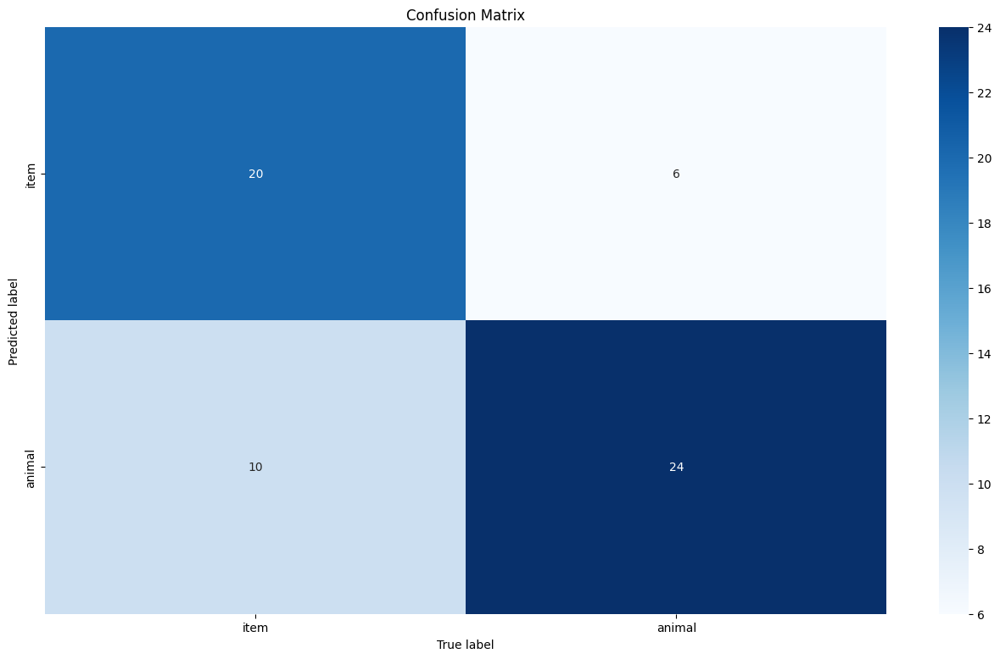

In [32]:
plt.figure(figsize=(16, 9))
sns.heatmap(cm.T, xticklabels=img_map.values(), yticklabels=img_map.values(), annot=True, fmt='d', cmap='Blues')
plt.xlabel('True label')
plt.ylabel('Predicted label')
plt.title('Confusion Matrix')
plt.show()

### Feature Extraction

In [33]:
embedding = tfk.Sequential(augmented_model.layers[:-2])
embedding.summary()


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ preprocessing (Sequential)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mp1 (MaxPooling2D)              │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mp2 (MaxPooling2D)              │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mp3 (MaxPooling2D)              │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv4 (Conv2D)                  │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mp4 (MaxPooling2D)              │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv5 (Conv2D)                  │ (None, 14, 14, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mp5 (MaxPooling2D)              │ (None, 7, 7, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,568,576 (5.98 MB)

 Trainable params: 1,568,576 (5.98 MB)

 Non-trainable params: 0 (0.00 B)

In [34]:
index = 0
img = np.expand_dims(X_test[index], axis=0)
img_embedding = embedding.predict(img, verbose=0)
print(f'Embedding shape {img_embedding.shape}')



Embedding shape (1, 7, 7, 512)


W0000 00:00:1723981850.475827   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981850.476482   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981850.476999   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981850.477527   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981850.478112   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981850.478658   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981850.479229   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981850.479746   97263 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1723981850.480292   97263 gp

Let's now compare the original image with feature extracted by the first 7x7 filter at 5th MaxPooling Layer

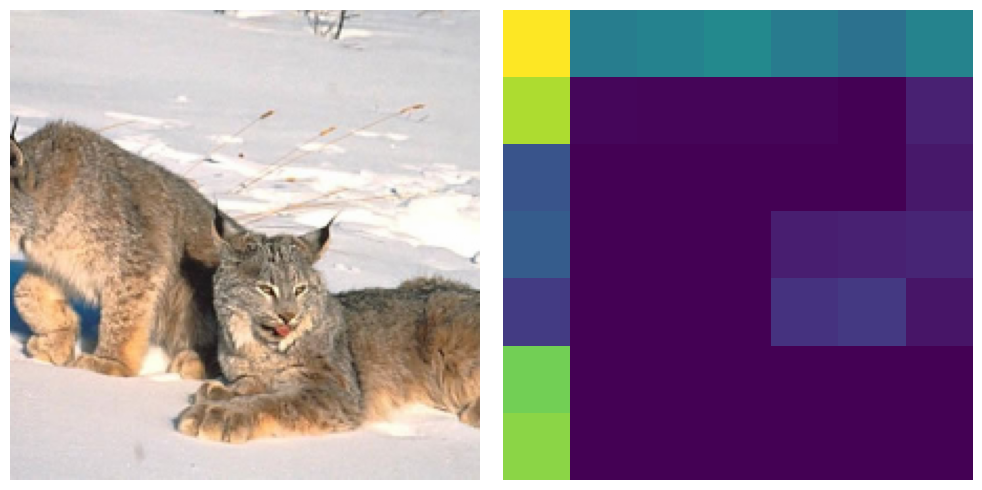

In [35]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(X_test[index])
axes[1].imshow(img_embedding[0][:,:, 0])
axes[0].axis('off')
axes[1].axis('off')
plt.tight_layout()
plt.show();
